In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from models import *
from utils import *
from test import test
from train import train
import torch.utils.data as data
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import copy
from torch.utils.data import TensorDataset
from torch.utils.data.sampler import SubsetRandomSampler
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#Create new examples by pairing all the possible combinations of n images taken 2
def samples_pair(dataset):
    paired = []
    labels = []
    for i in range(len(dataset)):
        paired.append(dataset[i][0].numpy())
        labels.append(dataset[i][1].item())
        for j in range(i, len(dataset)):
            r = np.random.random()
            if r >0.5:
                paired.append((dataset[i][0].numpy() + dataset[j][0].numpy())/2)
                labels.append(dataset[i][1].item())
    return paired, labels

In [3]:
# Seed Everything
torch.manual_seed(42)
torch.cuda.manual_seed(42)
np.random.seed(42)
random.seed(42)
torch.backends.cudnn.deterministic = True

In [4]:
#Load the victim's pretrained MNIST model
path_victim_mnist = 'pretrained_models/victim_mnist_l5.pt'

victim_mnist_model = MNIST_L5().cuda()

victim_mnist_model = load_state(victim_mnist_model, path_victim_mnist)
criterion = nn.CrossEntropyLoss()

Loading state from: pretrained_models/victim_mnist_l5.pt


In [5]:
#Original datasets
mnist_trainset, mnist_testset = get_mnist_dataset()

#Model extraction datasets
#This emnist dataset will be used to steal the mnist model. emnist consists of letter examples (A-a - Z-z)
emnist_trainset = get_emnist_dataset()

In [6]:
ratio = np.round(len(emnist_trainset)/len(mnist_trainset)*100, 2)
print('The ratio of the attacker data to the owner data before pairing {}/{}, {}\%'.format(len(emnist_trainset), 
                                        len(mnist_trainset),ratio))

The ratio of the attacker data to the owner data before pairing 300/60000, 0.5\%


In [7]:
# Get paired samples 
paired, labels = samples_pair(emnist_trainset)

In [8]:
ratio = np.round(len(paired)/len(mnist_trainset)*100, 2)
print('The ratio of the attacker data to the owner data before pairing {}/{}, {}\%'.format(len(paired),
                                                                        len(mnist_trainset), ratio))

The ratio of the attacker data to the owner data before pairing 22821/60000, 38.04\%


In [9]:
#Create dataset of two lists
tensor_x = torch.Tensor(paired) # transform to torch tensor
tensor_y = torch.Tensor(labels)

emnist_trainset = TensorDataset(tensor_x,tensor_y) # create your datset

In [10]:
#Plotting some samples
idx = np.random.choice(len(paired), 10, replace=False)

fig=plt.figure(figsize=(10, 10))
columns = 5
rows = 2
# for i in range(1, columns*rows +1):
#     fig.add_subplot(rows, columns, i)
#     img = paired[idx[i-1]].transpose(1, 2, 0)
#     plt.imshow(img)
#     plt.axis('off')
# plt.tight_layout()
# # plt.subplots_adjust(hspace=0, wspace=0.1)
# plt.show(block=True)

<Figure size 720x720 with 0 Axes>

In [11]:
#Load MNIST original train and test set to data loaders
mnist_test_loader = data.DataLoader(mnist_testset, batch_size=100, shuffle = False)
mnist_train_loader = data.DataLoader(mnist_trainset, batch_size=100, shuffle = False)

In [12]:
# The victim model's accuracy on the test set
test(victim_mnist_model, mnist_test_loader, criterion)

C:\Users\012709558\AppData\Local\Continuum\anaconda3\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)



Average test loss: 0.6765, Test accuracy: 9918/10000 (99.2%)



(0.6765414591233199, 0.9918)

In [13]:
# Create the attacker's query loader, his model and optimizer
attacker_query_loader = data.DataLoader(emnist_trainset, batch_size=100, shuffle = False)
attacker_mnist_model = exp_MNIST_L5().cuda()
attacker_optimizer = optim.SGD(attacker_mnist_model.parameters(), 
    lr=0.001, momentum = 0.9)

In [14]:
# Query the victim model using the attacker unlabeled data. The attacker labels his data usig the victim model
labels = query_labels(victim_mnist_model, attacker_query_loader)

In [15]:
# The returned quiries are devided to normal and watermarked quiries. The watermarked queries ratio is 2.5%
attacker_labled_data, watermark = get_attacker_dataset(emnist_trainset, labels, watermarked = False, 
                                                       watermark_ratio = 0.0)

In [16]:
#Loading the training data and the watermark data to data loaders
# Creating data indices for training and validation splits:
validation_split = .05
random_seed = 42

dataset_size = len(attacker_labled_data)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))


np.random.seed(random_seed)
np.random.shuffle(indices)

train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

attacker_train_loader = torch.utils.data.DataLoader(attacker_labled_data, batch_size=100,
                                           sampler=train_sampler)
attacker_val_loader = torch.utils.data.DataLoader(attacker_labled_data, batch_size=100,
                                                sampler=valid_sampler)


watermark_loader = data.DataLoader(watermark, batch_size=128, shuffle = False)

In [17]:
# Test the watermarks on the victim model. The accuracy of the victim model on the watermarks must be 0.
# test(victim_mnist_model, watermark_loader, criterion)

In [18]:
test(victim_mnist_model, mnist_test_loader, criterion)


Average test loss: 0.6765, Test accuracy: 9918/10000 (99.2%)



(0.6765414591233199, 0.9918)

In [19]:
# Test the attacker model accuracy on the test set before training. It should be random (something close to 10%)
test(attacker_mnist_model, mnist_test_loader, criterion)


Average test loss: 2.3014, Test accuracy: 945/10000 (9.4%)



(2.3014283037185668, 0.0945)

In [20]:
# Test the attacker model accuracy on the watermarks before training. It should be random (something close to 10%)
# test(attacker_mnist_model, watermark_loader, criterion)

In [21]:
#Training the attacker model on the paired data set
attacker_main_task_acc = []
watermark_acc = []
best_acc = 0
for epoch in tqdm_notebook(range(100)):
    attacker_mnist_model, loss = train(model=attacker_mnist_model, train_loader=attacker_train_loader, 
      criterion=criterion, optimizer=attacker_optimizer, local_epochs=1)
    print('Epoch: ', epoch+1)
    print('Attacker\'s model acc on the validation set')
    _, acc = test(attacker_mnist_model, attacker_val_loader, criterion)
    if acc > best_acc:
        best_acc = acc
        torch.save(attacker_mnist_model.state_dict(), 'best_mnist_attacker_model_first_different.pth')
#     print('Attacker\'s model acc on the watermark triggers')
#     _, wm_acc = test(attacker_mnist_model, watermark_loader, criterion)
#     attacker_main_task_acc.append(acc)
#     watermark_acc.append(wm_acc)

C:\Users\012709558\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  1
Attacker's model acc on the validation set

Average test loss: 2.0628, Test accuracy: 281/1141 (24.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  2
Attacker's model acc on the validation set

Average test loss: 2.0326, Test accuracy: 281/1141 (24.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  3
Attacker's model acc on the validation set

Average test loss: 1.9099, Test accuracy: 413/1141 (36.2%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  4
Attacker's model acc on the validation set

Average test loss: 1.6350, Test accuracy: 532/1141 (46.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  5
Attacker's model acc on the validation set

Average test loss: 1.4620, Test accuracy: 586/1141 (51.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  6
Attacker's model acc on the validation set

Average test loss: 1.3623, Test accuracy: 608/1141 (53.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  7
Attacker's model acc on the validation set

Average test loss: 1.2988, Test accuracy: 631/1141 (55.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  8
Attacker's model acc on the validation set

Average test loss: 1.2680, Test accuracy: 646/1141 (56.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  9
Attacker's model acc on the validation set

Average test loss: 1.2211, Test accuracy: 678/1141 (59.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  10
Attacker's model acc on the validation set

Average test loss: 1.1785, Test accuracy: 675/1141 (59.2%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  11
Attacker's model acc on the validation set

Average test loss: 1.1548, Test accuracy: 696/1141 (61.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  12
Attacker's model acc on the validation set

Average test loss: 1.1282, Test accuracy: 703/1141 (61.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  13
Attacker's model acc on the validation set

Average test loss: 1.0994, Test accuracy: 713/1141 (62.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  14
Attacker's model acc on the validation set

Average test loss: 1.0410, Test accuracy: 730/1141 (64.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  15
Attacker's model acc on the validation set

Average test loss: 1.0205, Test accuracy: 727/1141 (63.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  16
Attacker's model acc on the validation set

Average test loss: 0.9974, Test accuracy: 749/1141 (65.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  17
Attacker's model acc on the validation set

Average test loss: 0.9753, Test accuracy: 772/1141 (67.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  18
Attacker's model acc on the validation set

Average test loss: 0.9457, Test accuracy: 775/1141 (67.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  19
Attacker's model acc on the validation set

Average test loss: 0.9277, Test accuracy: 776/1141 (68.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  20
Attacker's model acc on the validation set

Average test loss: 0.8953, Test accuracy: 784/1141 (68.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  21
Attacker's model acc on the validation set

Average test loss: 0.9110, Test accuracy: 775/1141 (67.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  22
Attacker's model acc on the validation set

Average test loss: 0.8868, Test accuracy: 787/1141 (69.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  23
Attacker's model acc on the validation set

Average test loss: 0.8830, Test accuracy: 782/1141 (68.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  24
Attacker's model acc on the validation set

Average test loss: 0.8611, Test accuracy: 792/1141 (69.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  25
Attacker's model acc on the validation set

Average test loss: 0.8908, Test accuracy: 780/1141 (68.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  26
Attacker's model acc on the validation set

Average test loss: 0.8265, Test accuracy: 791/1141 (69.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  27
Attacker's model acc on the validation set

Average test loss: 0.8277, Test accuracy: 808/1141 (70.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  28
Attacker's model acc on the validation set

Average test loss: 0.8258, Test accuracy: 799/1141 (70.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  29
Attacker's model acc on the validation set

Average test loss: 0.8050, Test accuracy: 813/1141 (71.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  30
Attacker's model acc on the validation set

Average test loss: 0.8328, Test accuracy: 781/1141 (68.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  31
Attacker's model acc on the validation set

Average test loss: 0.8272, Test accuracy: 797/1141 (69.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  32
Attacker's model acc on the validation set

Average test loss: 0.8255, Test accuracy: 803/1141 (70.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  33
Attacker's model acc on the validation set

Average test loss: 0.7919, Test accuracy: 806/1141 (70.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  34
Attacker's model acc on the validation set

Average test loss: 0.7833, Test accuracy: 816/1141 (71.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  35
Attacker's model acc on the validation set

Average test loss: 0.8093, Test accuracy: 808/1141 (70.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  36
Attacker's model acc on the validation set

Average test loss: 0.7934, Test accuracy: 834/1141 (73.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  37
Attacker's model acc on the validation set

Average test loss: 0.8230, Test accuracy: 807/1141 (70.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  38
Attacker's model acc on the validation set

Average test loss: 0.7794, Test accuracy: 829/1141 (72.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  39
Attacker's model acc on the validation set

Average test loss: 0.7766, Test accuracy: 816/1141 (71.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  40
Attacker's model acc on the validation set

Average test loss: 0.7551, Test accuracy: 822/1141 (72.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  41
Attacker's model acc on the validation set

Average test loss: 0.7560, Test accuracy: 837/1141 (73.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  42
Attacker's model acc on the validation set

Average test loss: 0.7589, Test accuracy: 822/1141 (72.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  43
Attacker's model acc on the validation set

Average test loss: 0.7475, Test accuracy: 843/1141 (73.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  44
Attacker's model acc on the validation set

Average test loss: 0.7646, Test accuracy: 836/1141 (73.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  45
Attacker's model acc on the validation set

Average test loss: 0.7786, Test accuracy: 828/1141 (72.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  46
Attacker's model acc on the validation set

Average test loss: 0.7602, Test accuracy: 816/1141 (71.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  47
Attacker's model acc on the validation set

Average test loss: 0.7485, Test accuracy: 832/1141 (72.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  48
Attacker's model acc on the validation set

Average test loss: 0.7533, Test accuracy: 827/1141 (72.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  49
Attacker's model acc on the validation set

Average test loss: 0.7421, Test accuracy: 837/1141 (73.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  50
Attacker's model acc on the validation set

Average test loss: 0.7499, Test accuracy: 833/1141 (73.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  51
Attacker's model acc on the validation set

Average test loss: 0.7672, Test accuracy: 817/1141 (71.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  52
Attacker's model acc on the validation set

Average test loss: 0.7678, Test accuracy: 826/1141 (72.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  53
Attacker's model acc on the validation set

Average test loss: 0.7501, Test accuracy: 823/1141 (72.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  54
Attacker's model acc on the validation set

Average test loss: 0.7713, Test accuracy: 825/1141 (72.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  55
Attacker's model acc on the validation set

Average test loss: 0.7467, Test accuracy: 837/1141 (73.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  56
Attacker's model acc on the validation set

Average test loss: 0.7438, Test accuracy: 830/1141 (72.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  57
Attacker's model acc on the validation set

Average test loss: 0.7388, Test accuracy: 832/1141 (72.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  58
Attacker's model acc on the validation set

Average test loss: 0.7422, Test accuracy: 840/1141 (73.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  59
Attacker's model acc on the validation set

Average test loss: 0.7254, Test accuracy: 845/1141 (74.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  60
Attacker's model acc on the validation set

Average test loss: 0.7614, Test accuracy: 844/1141 (74.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  61
Attacker's model acc on the validation set

Average test loss: 0.7409, Test accuracy: 832/1141 (72.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  62
Attacker's model acc on the validation set

Average test loss: 0.7462, Test accuracy: 844/1141 (74.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  63
Attacker's model acc on the validation set

Average test loss: 0.7453, Test accuracy: 844/1141 (74.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  64
Attacker's model acc on the validation set

Average test loss: 0.7776, Test accuracy: 834/1141 (73.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  65
Attacker's model acc on the validation set

Average test loss: 0.7686, Test accuracy: 844/1141 (74.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  66
Attacker's model acc on the validation set

Average test loss: 0.7771, Test accuracy: 843/1141 (73.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  67
Attacker's model acc on the validation set

Average test loss: 0.7719, Test accuracy: 830/1141 (72.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  68
Attacker's model acc on the validation set

Average test loss: 0.7501, Test accuracy: 840/1141 (73.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  69
Attacker's model acc on the validation set

Average test loss: 0.7764, Test accuracy: 822/1141 (72.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  70
Attacker's model acc on the validation set

Average test loss: 0.7670, Test accuracy: 836/1141 (73.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  71
Attacker's model acc on the validation set

Average test loss: 0.7783, Test accuracy: 835/1141 (73.2%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  72
Attacker's model acc on the validation set

Average test loss: 0.8003, Test accuracy: 836/1141 (73.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  73
Attacker's model acc on the validation set

Average test loss: 0.8132, Test accuracy: 834/1141 (73.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  74
Attacker's model acc on the validation set

Average test loss: 0.8003, Test accuracy: 839/1141 (73.5%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  75
Attacker's model acc on the validation set

Average test loss: 0.7841, Test accuracy: 843/1141 (73.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  76
Attacker's model acc on the validation set

Average test loss: 0.8339, Test accuracy: 843/1141 (73.9%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  77
Attacker's model acc on the validation set

Average test loss: 0.8180, Test accuracy: 836/1141 (73.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  78
Attacker's model acc on the validation set

Average test loss: 0.8393, Test accuracy: 844/1141 (74.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  79
Attacker's model acc on the validation set

Average test loss: 0.8244, Test accuracy: 833/1141 (73.0%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  80
Attacker's model acc on the validation set

Average test loss: 0.8285, Test accuracy: 848/1141 (74.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  81
Attacker's model acc on the validation set

Average test loss: 0.8479, Test accuracy: 840/1141 (73.6%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  82
Attacker's model acc on the validation set

Average test loss: 0.8872, Test accuracy: 829/1141 (72.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  83
Attacker's model acc on the validation set

Average test loss: 0.8824, Test accuracy: 842/1141 (73.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  84
Attacker's model acc on the validation set

Average test loss: 0.8913, Test accuracy: 842/1141 (73.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  85
Attacker's model acc on the validation set

Average test loss: 0.9269, Test accuracy: 825/1141 (72.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  86
Attacker's model acc on the validation set

Average test loss: 0.9056, Test accuracy: 836/1141 (73.3%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  87
Attacker's model acc on the validation set

Average test loss: 0.9275, Test accuracy: 838/1141 (73.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  88
Attacker's model acc on the validation set

Average test loss: 0.9386, Test accuracy: 835/1141 (73.2%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  89
Attacker's model acc on the validation set

Average test loss: 0.9823, Test accuracy: 826/1141 (72.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  90
Attacker's model acc on the validation set

Average test loss: 0.9441, Test accuracy: 841/1141 (73.7%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  91
Attacker's model acc on the validation set

Average test loss: 0.9843, Test accuracy: 831/1141 (72.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  92
Attacker's model acc on the validation set

Average test loss: 0.9923, Test accuracy: 846/1141 (74.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  93
Attacker's model acc on the validation set

Average test loss: 0.9763, Test accuracy: 837/1141 (73.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  94
Attacker's model acc on the validation set

Average test loss: 1.0542, Test accuracy: 826/1141 (72.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  95
Attacker's model acc on the validation set

Average test loss: 1.0445, Test accuracy: 838/1141 (73.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  96
Attacker's model acc on the validation set

Average test loss: 1.0463, Test accuracy: 826/1141 (72.4%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  97
Attacker's model acc on the validation set

Average test loss: 1.0743, Test accuracy: 834/1141 (73.1%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  98
Attacker's model acc on the validation set

Average test loss: 1.0798, Test accuracy: 831/1141 (72.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  99
Attacker's model acc on the validation set

Average test loss: 1.0678, Test accuracy: 842/1141 (73.8%)



  0%|          | 0/1 [00:00<?, ?it/s]

Epoch:  100
Attacker's model acc on the validation set

Average test loss: 1.1049, Test accuracy: 839/1141 (73.5%)



In [22]:
attacker_mnist_model.load_state_dict(torch.load('best_mnist_attacker_model_first_different.pth'))

<All keys matched successfully>

In [23]:
def our_test(local_model, device, local_test_loader):

    # Accuracy counter
    correct = 0
    wrong_examples = []
    logits = []
    labels = []
    counter = 0

    # Loop over all examples in test set
    for data, target in local_test_loader:
        counter += 1

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Forward pass the data through the model

        with torch.no_grad():
            output = local_model(data)
#             print(output)
#             print(counter)
#             print(target)

        # Check for success
    
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
#         final_pred = output.argmax()
#         print(final_pred)
        if final_pred.item() == target.item():
#             print('same')
            correct += 1
        else:
#             print('hi')

            wrong_examples.append(data)
            labels.append(target)
            logits.append(output)
        if len(labels) > 300:
            break
    
    # Calculate final accuracy for this epsilon
    print(len(local_test_loader))
    print(correct)
    final_acc = correct/float(len(local_test_loader))

    # Return the accuracy and an adversarial example
    return final_acc, wrong_examples, labels, logits

In [24]:
new_batch_size = 1
our_test_loader = torch.utils.data.DataLoader(mnist_testset, new_batch_size, num_workers=0, pin_memory=True)

In [25]:
# Get wrong predictions
accuracy, wrong_examples, labels, logits = our_test(victim_mnist_model, "cuda", our_test_loader)

10000
9918


In [26]:
wrong_labels = [logits[i].max(1, keepdim=True)[1].item() for i in range(len(labels))]

In [27]:
len(wrong_labels)

82

In [28]:
corrected_examples = np.zeros([len(wrong_examples)])

In [29]:
perturbed_examples = []
new_labels = []
eps_all = []
for i in range(len(wrong_examples)):
    x, y, prediction = wrong_examples[i], labels[i], logits[i]
    eps = 0.0
#     print(i)
    while True:
        perturbed_image = x.clone()
        perturbed_image.requires_grad = True
        output = attacker_mnist_model(perturbed_image)
        loss = F.nll_loss(output, y)
        attacker_mnist_model.zero_grad()
            # Calculate gradients of model in backward pass
        loss.backward()
        img_grad = perturbed_image.grad.data
        perturbed_image = perturbed_image - eps*img_grad
        output = victim_mnist_model(perturbed_image)
        new_label = output.max(1, keepdim=True)[1]
        if(new_label.item() == y.item()):
            perturbed_examples.append(perturbed_image.squeeze().data.cpu().numpy())
            new_labels.append(new_label)
            eps_all.append(eps)
            corrected_examples[i] = 1
            print("Image {} has been modified with epsilon {}".format(i, eps))
            break
        eps += 0.0005
        if eps > 0.99:
            break

Image 0 has been modified with epsilon 0.07450000000000005
Image 2 has been modified with epsilon 0.5144999999999987
Image 3 has been modified with epsilon 0.9314999999999528
Image 5 has been modified with epsilon 0.8704999999999595
Image 6 has been modified with epsilon 0.45850000000000035
Image 11 has been modified with epsilon 0.59399999999999
Image 12 has been modified with epsilon 0.23050000000000018
Image 14 has been modified with epsilon 0.3140000000000002
Image 15 has been modified with epsilon 0.5999999999999893
Image 16 has been modified with epsilon 0.4895000000000004
Image 18 has been modified with epsilon 0.11700000000000009
Image 19 has been modified with epsilon 0.11350000000000009
Image 21 has been modified with epsilon 0.1575000000000001
Image 22 has been modified with epsilon 0.47050000000000036
Image 23 has been modified with epsilon 0.25050000000000017
Image 25 has been modified with epsilon 0.010000000000000005
Image 27 has been modified with epsilon 0.268500000000

In [30]:
real_examples = []
real_labels = []
wrong_predictions = []
corrected_idx = np.where(corrected_examples == 1)
for idx in corrected_idx[0]:
    real_examples.append(wrong_examples[idx].squeeze().data.cpu().numpy())
    real_labels.append(labels[idx].item())
    wrong_predictions.append(wrong_labels[idx])

In [31]:
def get_quartlies(samples):
    q1, med, q3 = np.percentile(samples, [25, 50, 75])
    return q3, q3-q1

In [32]:
diff = []
tau = 8
for i in range(len(eps_all)):
    diff.append((real_examples[i] - perturbed_examples[i])**2)
    q3, iqr = get_quartlies(diff[i])
    idx = np.where(diff[i] < q3+iqr*tau)
    diff[i][idx]*=0

In [33]:
diff2 = diff
for im in range(len(diff)):
        for color in range(28):
            for pixel in range(28):
                if diff[im][color][pixel] > 0.0:
                    diff2[im][color][pixel] = 1
                                


In [34]:
real_examples[0].shape

(28, 28)

In [35]:
len(real_examples)

44

In [36]:
path_wrong = 'D:/mnist_model_steal/source code/output_images/first_surrogate/wrong'

In [37]:
for i in range(len(perturbed_examples)):
    for j in range(len(perturbed_examples[i])):
        for k in range(len(perturbed_examples[i][j])):
            perturbed_examples[i][j][k] = (perturbed_examples[i][j][k]-perturbed_examples[i].min())/(perturbed_examples[i].max()-perturbed_examples[i].min())


In [38]:
for i in range(len(wrong_predictions)):
    image1 = torch.from_numpy(real_examples[i])
#     image = z.permute(1,2,0)
# # #     z = np.float32(z)
#     plt.imsave(path_wrong+'/original/'+str(i)+".jpg",z)
#     z = torch.from_numpy(perturbed_examples[i])
#     image = z.permute(1,2,0)
# #     z = np.float32(z)
#     plt.imsave(path_wrong+'/edited/'+str(i)+".jpg",z)
    image2 = torch.from_numpy(diff[i])
    z = image1+image2
#     image = z.permute(1,2,0)
#     z = np.float32(z)
    for color in range(28):
        for pixel in range(28):
            if z[color][pixel] > 0.0:
                z[color][pixel] = 1
    plt.imsave(path_wrong+'/image_with_exp/'+str(i)+".jpg",z, cmap='hot')
    plt.imsave(path_wrong+'/image_with_exp_2/'+str(i)+".jpg",z)

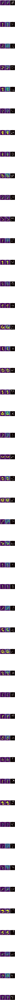

In [39]:
#real_examples, perturbed_examples, diff, real_labels, wrong_predictions
fig=plt.figure(figsize=(12, 800))
columns = 3
rows = len(wrong_predictions)
c = 1
for i in range(len(wrong_predictions)):
    ax = fig.add_subplot(rows, columns, c)
    ax.set_title('Predicted as {}'.format(wrong_predictions[i]))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    image =torch.from_numpy(real_examples[i])
#     image = z.permute(1,2,0)
    plt.imshow(image)
    ax = fig.add_subplot(rows, columns, c+1)
    ax.set_title('Corrected image as {}'.format(real_labels[i]))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    image =torch.from_numpy(perturbed_examples[i])
#     image = z.permute(1,2,0)
    plt.imshow(image)
    ax = fig.add_subplot(rows, columns, c+2)
    ax.set_title('Pixels cause')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    image =torch.from_numpy(diff[i])
#     image = z.permute(1,2,0)
    plt.imshow(image, cmap='hot')
    c = c + 3
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(True)
plt.show(block=True)

In [39]:
def our_test_true_classified(local_model, device, local_test_loader):

    # Accuracy counter
    correct = 0
    wrong_examples = []
    logits = []
    labels = []
    counter = 0
    second_label = []

    # Loop over all examples in test set
    for data, target in local_test_loader:
        counter += 1

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Forward pass the data through the model

        with torch.no_grad():
            output = local_model(data)
#             print(output)
#             print(counter)
#             print(target)

        # Check for success
    
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        check = torch.topk(output, 2)
#         print(final_pred)
#         print(check.indices[0][1])
#         second_label.append(check.indices[0][1])
#         final_pred = output.argmax()
#         print(final_pred)
        if final_pred.item() == target.item():
            wrong_examples.append(data)
            labels.append(target)
            logits.append(output)
            second_label.append(check.indices[0][1])
#             print('same')
            correct += 1
#         else:
#             print('hi')

#             wrong_examples.append(data)
#             labels.append(target)
#             logits.append(output)
#         if len(labels) > 300:
#             break
    
    # Calculate final accuracy for this epsilon
#     print(len(local_test_loader))
#     print(correct)
    final_acc = correct/float(len(local_test_loader))

    # Return the accuracy and an adversarial example
    return final_acc, wrong_examples, labels, logits, second_label

In [40]:
accuracy, wrong_examples, labels, logits, second = our_test_true_classified(victim_mnist_model, "cuda", our_test_loader)

In [41]:
len(labels)

9918

In [42]:
len(wrong_examples)

9918

In [ ]:
corrected_examples = np.zeros([len(wrong_examples)])
perturbed_examples = []
new_labels = []
eps_all = []
new_counter = 0
for i in range(len(wrong_examples)):
    x, y, prediction = wrong_examples[i], torch.tensor([int(second[i])]).to('cuda'), logits[i]
    eps = 0.0
#     print(i)
    while True:
        perturbed_image = x.clone()
        perturbed_image.requires_grad = True
        output = attacker_mnist_model(perturbed_image)
        loss = F.nll_loss(output, y)
        attacker_mnist_model.zero_grad()
            # Calculate gradients of model in backward pass
        loss.backward()
        img_grad = perturbed_image.grad.data
        perturbed_image = perturbed_image - eps*img_grad
        output = victim_mnist_model(perturbed_image)
        new_label = output.max(1, keepdim=True)[1]
        if(new_label.item() == y.item()):
            new_counter += 1
            perturbed_examples.append(perturbed_image.squeeze().data.cpu().numpy())
            new_labels.append(new_label)
            eps_all.append(eps)
            corrected_examples[i] = 1
            print("Image {} has been modified with epsilon {}".format(i, eps))
            break
        eps += 0.005
        if eps > 0.99:
            break

Image 6 has been modified with epsilon 0.9150000000000007
Image 21 has been modified with epsilon 0.8000000000000006
Image 33 has been modified with epsilon 0.3750000000000002
Image 43 has been modified with epsilon 0.5550000000000004
Image 93 has been modified with epsilon 0.9400000000000007
Image 106 has been modified with epsilon 0.38500000000000023
Image 119 has been modified with epsilon 0.5150000000000003
Image 137 has been modified with epsilon 0.42000000000000026
Image 149 has been modified with epsilon 0.9850000000000008
Image 156 has been modified with epsilon 0.42000000000000026
Image 171 has been modified with epsilon 0.9100000000000007
Image 178 has been modified with epsilon 0.9000000000000007
Image 182 has been modified with epsilon 0.27500000000000013
Image 197 has been modified with epsilon 0.5800000000000004
Image 200 has been modified with epsilon 0.8550000000000006
Image 212 has been modified with epsilon 0.5400000000000004
Image 213 has been modified with epsilon 0

Image 1092 has been modified with epsilon 0.6100000000000004
Image 1097 has been modified with epsilon 0.42500000000000027
Image 1099 has been modified with epsilon 0.3700000000000002
Image 1100 has been modified with epsilon 0.8700000000000007
Image 1111 has been modified with epsilon 0.8850000000000007
Image 1116 has been modified with epsilon 0.7850000000000006
Image 1129 has been modified with epsilon 0.9250000000000007
Image 1130 has been modified with epsilon 0.5050000000000003
Image 1132 has been modified with epsilon 0.045
Image 1135 has been modified with epsilon 0.5250000000000004
Image 1144 has been modified with epsilon 0.9600000000000007
Image 1151 has been modified with epsilon 0.6400000000000005
Image 1166 has been modified with epsilon 0.4800000000000003
Image 1175 has been modified with epsilon 0.9850000000000008
Image 1177 has been modified with epsilon 0.3300000000000002
Image 1211 has been modified with epsilon 0.10500000000000002
Image 1222 has been modified with e

Image 2103 has been modified with epsilon 0.7950000000000006
Image 2108 has been modified with epsilon 0.16500000000000006
Image 2117 has been modified with epsilon 0.4900000000000003
Image 2126 has been modified with epsilon 0.9450000000000007
Image 2132 has been modified with epsilon 0.6200000000000004
Image 2147 has been modified with epsilon 0.6300000000000004
Image 2148 has been modified with epsilon 0.7900000000000006
Image 2155 has been modified with epsilon 0.5300000000000004
Image 2158 has been modified with epsilon 0.8800000000000007
Image 2171 has been modified with epsilon 0.7750000000000006
Image 2177 has been modified with epsilon 0.9750000000000008
Image 2182 has been modified with epsilon 0.4550000000000003
Image 2191 has been modified with epsilon 0.6500000000000005
Image 2194 has been modified with epsilon 0.3650000000000002
Image 2195 has been modified with epsilon 0.42500000000000027
Image 2197 has been modified with epsilon 0.2600000000000001
Image 2198 has been mo

In [ ]:
new_counter

In [ ]:
corrected_idx[0][2]

In [ ]:
real_examples = []
real_labels = []
wrong_predictions = []
corrected_idx = np.where(corrected_examples == 1)
print(len(corrected_idx))
for idx in corrected_idx[0]:
    real_examples.append(wrong_examples[idx].squeeze().data.cpu().numpy())
    real_labels.append(labels[idx].item())
    wrong_predictions.append(second[idx])

In [ ]:
len(real_examples)

In [ ]:
len(real_labels)

In [ ]:
len(wrong_predictions)

In [ ]:
len(perturbed_examples)#-len(wrong_predictions)

In [ ]:
def get_quartlies(samples):
    q1, med, q3 = np.percentile(samples, [25, 50, 75])
    return q3, q3-q1

In [ ]:
diff = []
tau = 12
for i in range(len(eps_all)):
    diff.append((real_examples[i] - perturbed_examples[i])**2)
    q3, iqr = get_quartlies(diff[i])
    idx = np.where(diff[i] < q3+iqr*tau)
    diff[i][idx]*=0

In [ ]:
diff2 = diff
for im in range(len(diff)):
        for color in range(28):
            for pixel in range(28):
                if diff[im][color][pixel] > 0.0:
                    diff2[im][color][pixel] = 1
                                


In [ ]:
path_wrong = 'D:/mnist_model_steal/source code/output_images/first_surrogate/wright'

In [ ]:
len(perturbed_examples)

In [ ]:
len(wrong_predictions)

In [ ]:
len(real_examples)

In [ ]:
for i in range(len(real_examples)):
    image1 = torch.from_numpy(real_examples[i])
#     image = z.permute(1,2,0)
# # #     z = np.float32(z)
#     plt.imsave(path_wrong+'/original/'+str(i)+".jpg",z)
#     z = torch.from_numpy(perturbed_examples[i])
#     image = z.permute(1,2,0)
# #     z = np.float32(z)
#     plt.imsave(path_wrong+'/edited/'+str(i)+".jpg",z)
    image3 = torch.from_numpy(diff[i])
    z = image1 + image3
#     image = z.permute(1,2,0)
#     z = np.float32(z)
    for color in range(28):
        for pixel in range(28):
            if z[color][pixel] > 0.0:
                z[color][pixel] = 1
    plt.imsave(path_wrong+'/image_with_exp/'+str(i)+".jpg",z)
#     plt.imsave(path_wrong+'/exp1/'+str(i)+".jpg",z, cmap='hot')

C:\Users\012709558\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:33: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


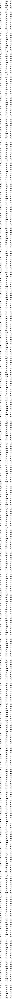

In [61]:
#real_examples, perturbed_examples, diff, real_labels, wrong_predictions
fig=plt.figure(figsize=(12, 800))
columns = 3
rows = len(wrong_predictions)
c = 1
for i in range(len(wrong_predictions)):
    ax = fig.add_subplot(rows, columns, c)
    ax.set_title('Predicted as {}'.format(wrong_predictions[i]))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    image =torch.from_numpy(real_examples[i])
#     image = z.permute(1,2,0)
    plt.imshow(image)
    ax = fig.add_subplot(rows, columns, c+1)
    ax.set_title('Corrected image as {}'.format(real_labels[i]))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    image =torch.from_numpy(perturbed_examples[i])
#     image = z.permute(1,2,0)
    plt.imshow(image)
    ax = fig.add_subplot(rows, columns, c+2)
    ax.set_title('Pixels cause')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal')
    image =torch.from_numpy(diff[i])
#     image = z.permute(1,2,0)
    plt.imshow(image, cmap='hot')
    c = c + 3
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(True)
plt.show(block=True)